In [1]:
#Install the necessary libraries
!pip install pycocotools
!pip install keras
!pip install h5py
!pip install Rouge
!pip install pycocoevalcap
!python -m nltk.downloader wordnet
!pip install gtts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 8.2 MB/s eta 0:00:00
/usr/lib/python3.10/runpy.py:126: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
  warn(RuntimeWarning(msg))
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [2]:
# Importing necessary libraries
import os
from pickle import dump, load
import json
import random
import string
import numpy as np
import cv2
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional, Input, Dropout, Attention
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.xception import Xception, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from keras.layers import add
from pycocotools.coco import COCO  # COCO python library
from tqdm.notebook import tqdm  # Small library for seeing the progress of loops
from itertools import chain
from keras.utils import plot_model
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
from keras.applications import Xception
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.meteor_score import meteor_score
from nltk.tokenize import word_tokenize
from rouge import Rouge
import nltk
from gtts import gTTS
import IPython.display as ipd
from google.colab import files
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from collections import Counter
from wordcloud import WordCloud

# Setting matplotlib parameters
pylab.rcParams['figure.figsize'] = (8.0, 10.0)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
# Downloading and extracting annotations for COCO dataset
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip /content/annotations_trainval2017.zip

--2024-04-03 23:56:17--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.233.177, 52.217.72.60, 54.231.163.217, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.233.177|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  96.1MB/s    in 2.5s    

2024-04-03 23:56:20 (96.1 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  /content/annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  


In [4]:
# Downloading and extracting the training images for COCO dataset
!wget http://images.cocodataset.org/zips/train2017.zip
!unzip /content/train2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: train2017/000000259556.jpg  
 extracting: train2017/000000381931.jpg  
 extracting: train2017/000000569592.jpg  
 extracting: train2017/000000229396.jpg  
 extracting: train2017/000000488990.jpg  
 extracting: train2017/000000348684.jpg  
 extracting: train2017/000000234031.jpg  
 extracting: train2017/000000563584.jpg  
 extracting: train2017/000000276069.jpg  
 extracting: train2017/000000401194.jpg  
 extracting: train2017/000000502089.jpg  
 extracting: train2017/000000192183.jpg  
 extracting: train2017/000000425127.jpg  
 extracting: train2017/000000126766.jpg  
 extracting: train2017/000000324161.jpg  
 extracting: train2017/000000452746.jpg  
 extracting: train2017/000000423782.jpg  
 extracting: train2017/000000546343.jpg  
 extracting: train2017/000000249290.jpg  
 extracting: train2017/000000025529.jpg  
 extracting: train2017/000000316928.jpg  
 extracting: train2017/000000337866.jpg  
 extracting: train2017/00

In [5]:
# Downloading and extracting the validation images for COCO dataset
!wget http://images.cocodataset.org/zips/val2017.zip
!unzip /content/val2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000212226.jpg  
 extracting: val2017/000000231527.jpg  
 extracting: val2017/000000578922.jpg  
 extracting: val2017/000000062808.jpg  
 extracting: val2017/000000119038.jpg  
 extracting: val2017/000000114871.jpg  
 extracting: val2017/000000463918.jpg  
 extracting: val2017/000000365745.jpg  
 extracting: val2017/000000320425.jpg  
 extracting: val2017/000000481404.jpg  
 extracting: val2017/000000314294.jpg  
 extracting: val2017/000000335328.jpg  
 extracting: val2017/000000513688.jpg  
 extracting: val2017/000000158548.jpg  
 extracting: val2017/000000132116.jpg  
 extracting: val2017/000000415238.jpg  
 extracting: val2017/000000321333.jpg  
 extracting: val2017/000000081738.jpg  
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/00000011

In [6]:
# Creating a COCO object for the training annotations
coco=COCO("../content/annotations/instances_train2017.json")

loading annotations into memory...
Done (t=29.53s)
creating index...
index created!


In [7]:
# Loading categories and their supercategories
cats = coco.loadCats(coco.getCatIds())

# Extracting unique supercategories
maincategories = list(set([cat['supercategory'] for cat in cats]))

# Printing the number of main categories and the list of main categories
print("Number of main categories: ", len(maincategories))
print("List of main categories: ", maincategories)


Number of main categories:  12
List of main categories:  ['indoor', 'electronic', 'food', 'sports', 'furniture', 'outdoor', 'person', 'animal', 'accessory', 'kitchen', 'vehicle', 'appliance']


In [8]:
# Extracting all subcategories
subcategories = [cat['name'] for cat in cats]

# Printing the number of subcategories and the list of subcategories
print("Number of sub categories: ", len(subcategories))
print("List of sub categories: ", subcategories)

Number of sub categories:  80
List of sub categories:  ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [9]:
# Getting category IDs for subcategories
catIds = coco.getCatIds(catNms=subcategories)

# Creating a dictionary to map subcategories to their IDs
subcategories_Ids = dict()
for i in range(0,len(subcategories)):
    subcategories_Ids[subcategories[i]] = catIds[i]

# Printing the dictionary containing subcategories with their corresponding IDs
print("Sub categories with IDs :",subcategories_Ids)

Sub categories with IDs : {'person': 1, 'bicycle': 2, 'car': 3, 'motorcycle': 4, 'airplane': 5, 'bus': 6, 'train': 7, 'truck': 8, 'boat': 9, 'traffic light': 10, 'fire hydrant': 11, 'stop sign': 13, 'parking meter': 14, 'bench': 15, 'bird': 16, 'cat': 17, 'dog': 18, 'horse': 19, 'sheep': 20, 'cow': 21, 'elephant': 22, 'bear': 23, 'zebra': 24, 'giraffe': 25, 'backpack': 27, 'umbrella': 28, 'handbag': 31, 'tie': 32, 'suitcase': 33, 'frisbee': 34, 'skis': 35, 'snowboard': 36, 'sports ball': 37, 'kite': 38, 'baseball bat': 39, 'baseball glove': 40, 'skateboard': 41, 'surfboard': 42, 'tennis racket': 43, 'bottle': 44, 'wine glass': 46, 'cup': 47, 'fork': 48, 'knife': 49, 'spoon': 50, 'bowl': 51, 'banana': 52, 'apple': 53, 'sandwich': 54, 'orange': 55, 'broccoli': 56, 'carrot': 57, 'hot dog': 58, 'pizza': 59, 'donut': 60, 'cake': 61, 'chair': 62, 'couch': 63, 'potted plant': 64, 'bed': 65, 'dining table': 67, 'toilet': 70, 'tv': 72, 'laptop': 73, 'mouse': 74, 'remote': 75, 'keyboard': 76, 'c

In [10]:
# Creating a dictionary to store image IDs for each subcategory
subcategories_imageIds = dict()

for i in range(0,len(catIds)):
    imgIds = coco.getImgIds(catIds=catIds[i])
    img = []
    for j in imgIds:
        img.append(j)
    subcategories_imageIds[subcategories[i]] = img

# Printing the number of subcategories with their associated image IDs
print("Sub categories with Image IDs :",len(subcategories_imageIds))

Sub categories with Image IDs : 80


In [11]:
# Creating a dictionary to store the length of image lists for each subcategory
length_dict = {key: len(value) for key, value in subcategories_imageIds.items()}

# Printing the total number of images in each subcategory
print("Total images in each sub categories: ", length_dict)

Total images in each sub categories:  {'person': 64115, 'bicycle': 3252, 'car': 12251, 'motorcycle': 3502, 'airplane': 2986, 'bus': 3952, 'train': 3588, 'truck': 6127, 'boat': 3025, 'traffic light': 4139, 'fire hydrant': 1711, 'stop sign': 1734, 'parking meter': 705, 'bench': 5570, 'bird': 3237, 'cat': 4114, 'dog': 4385, 'horse': 2941, 'sheep': 1529, 'cow': 1968, 'elephant': 2143, 'bear': 960, 'zebra': 1916, 'giraffe': 2546, 'backpack': 5528, 'umbrella': 3968, 'handbag': 6841, 'tie': 3810, 'suitcase': 2402, 'frisbee': 2184, 'skis': 3082, 'snowboard': 1654, 'sports ball': 4262, 'kite': 2261, 'baseball bat': 2506, 'baseball glove': 2629, 'skateboard': 3476, 'surfboard': 3486, 'tennis racket': 3394, 'bottle': 8501, 'wine glass': 2533, 'cup': 9189, 'fork': 3555, 'knife': 4326, 'spoon': 3529, 'bowl': 7111, 'banana': 2243, 'apple': 1586, 'sandwich': 2365, 'orange': 1699, 'broccoli': 1939, 'carrot': 1683, 'hot dog': 1222, 'pizza': 3166, 'donut': 1523, 'cake': 2925, 'chair': 12774, 'couch': 44

In [12]:
# Combining image IDs for 'airplane' and 'bear' categories to get unique images
train_cats = subcategories_imageIds['airplane'] +  subcategories_imageIds['bicycle'] +  subcategories_imageIds['bear'] +  subcategories_imageIds['dog'] +  subcategories_imageIds['fire hydrant']
imgIdss = coco.getImgIds(imgIds = train_cats)

# Printing the total number of unique images
print("Total Images: ", len(imgIdss))

Total Images:  12972


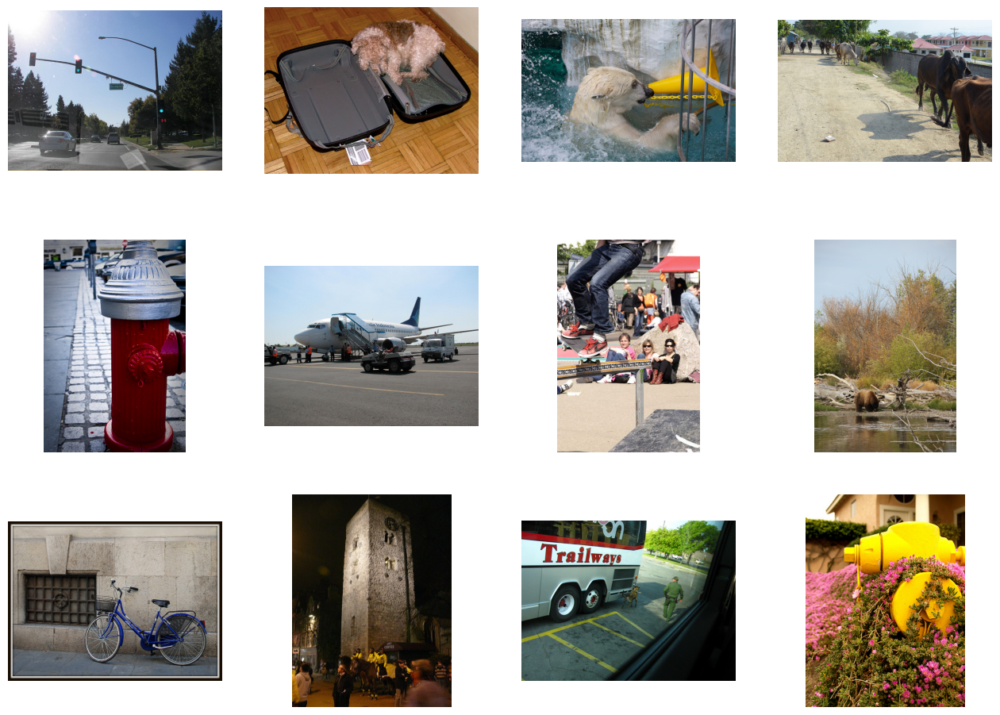

In [13]:
# Setting the figure size
fig = plt.gcf()
fig.set_size_inches(16, 16)

# Shuffling the list of image IDs
next_pix = imgIdss
random.shuffle(next_pix)

# Displaying the first 12 images
for i, img_path in enumerate(next_pix[0:12]):
    sp = plt.subplot(4, 4, i + 1)
    sp.axis('Off')
# Loading and displaying the image
    img = coco.loadImgs(img_path)[0]
    I = io.imread(img['coco_url'])
    plt.imshow(I)
# Displaying the plot
plt.show()

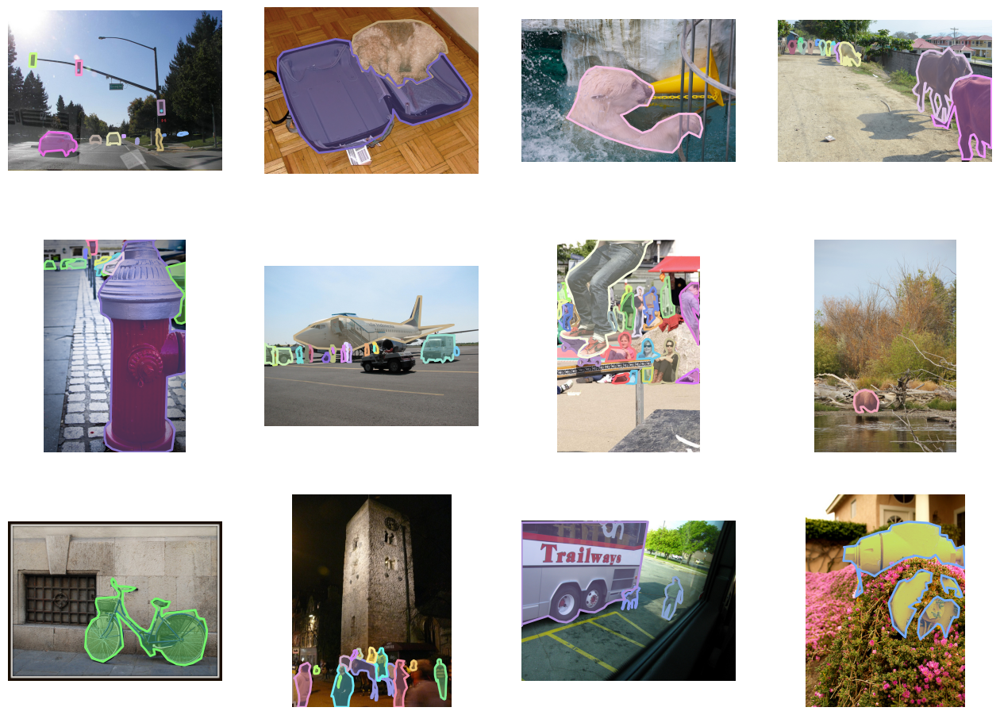

In [14]:
# Setting the figure size
fig = plt.gcf()
fig.set_size_inches(16, 16)

# Displaying annotations along with the images
for i, img_path in enumerate(next_pix[0:12]):
    sp = plt.subplot(4, 4, i + 1)
    sp.axis('Off')

# Loading and displaying the image
    img = coco.loadImgs(img_path)[0]
    I = io.imread(img['coco_url'])
    plt.imshow(I)

# Getting annotation IDs for the current image and category IDs
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns = coco.loadAnns(annIds)

# Displaying annotations
    coco.showAnns(anns)

# Displaying the plot
plt.show()

In [15]:
# Defining the path to the annotations file
annFile = "../content/annotations/person_keypoints_train2017.json"

# Creating a COCO object for keypoints annotations
coco_kps=COCO(annFile)

loading annotations into memory...
Done (t=15.34s)
creating index...
index created!


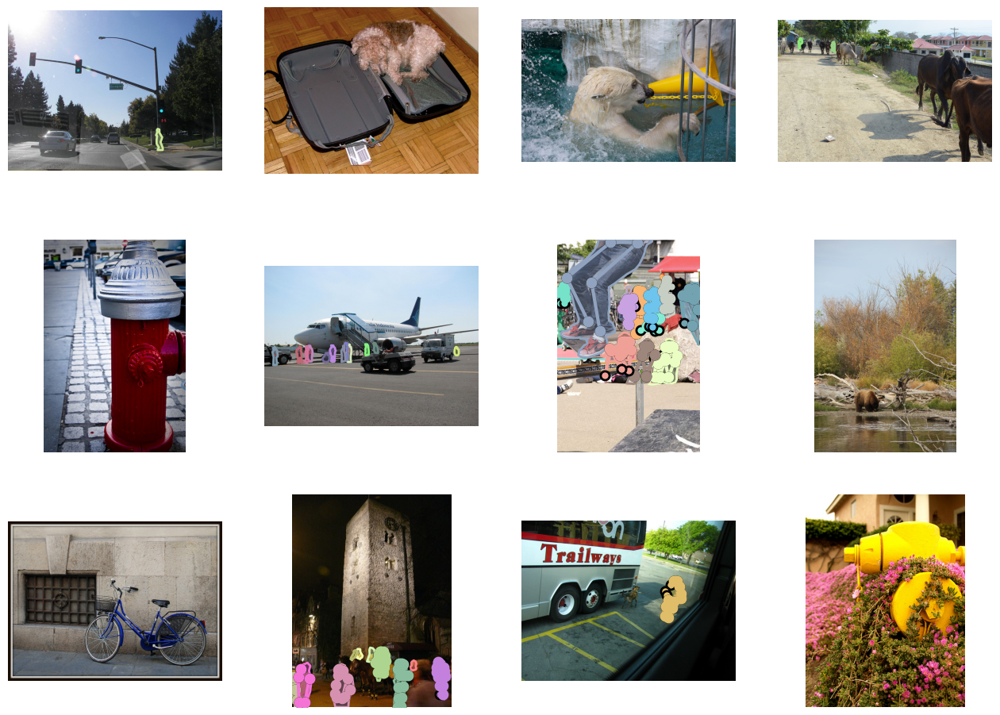

In [16]:
# Setting the figure size
fig = plt.gcf()
fig.set_size_inches(16, 16)

# Displaying images with keypoints annotations
for i, img_path in enumerate(next_pix[0:12]):
    # Creating subplots
    sp = plt.subplot(4, 4, i + 1)
    sp.axis('Off')

    # Loading and displaying the image
    img = coco.loadImgs(img_path)[0]
    I = io.imread(img['coco_url'])
    plt.imshow(I)

    # Getting annotation IDs for keypoints for the current image and category IDs
    annIds = coco_kps.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns = coco_kps.loadAnns(annIds)

    # Displaying keypoints annotations
    coco_kps.showAnns(anns)

# Displaying the plot
plt.show()

In [17]:
# Defining the path to the captions annotations file
annFile = "../content/annotations/captions_train2017.json"

# Creating a COCO object for captions annotations
coco_caps=COCO(annFile)

loading annotations into memory...
Done (t=1.74s)
creating index...
index created!


A white toyota drives under a stoplight with a google sign.
A street with a stoplight and Google street sign. 
An intersection photograph[hed through the windshield of a car,
Road with cars and a green traffic light.
This photograph was taken from inside a vehicle on a road with a cross street called "Google".


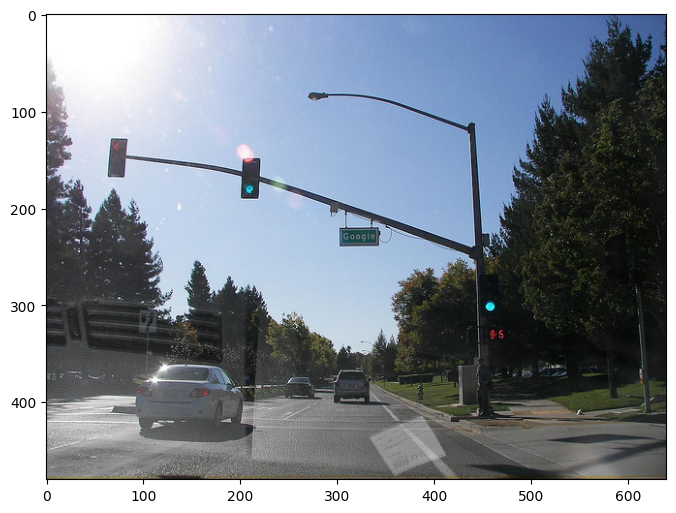

In [18]:
# Loading an image and its corresponding captions annotations
img = coco.loadImgs(next_pix[0])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)

# Getting annotation IDs for captions for the current image
annIds = coco_caps.getAnnIds(imgIds=img['id'])
anns = coco_caps.loadAnns(annIds)

# Displaying captions annotations
coco_caps.showAnns(anns)

# Showing the plot
plt.show()


The dog is laying down in the suitcase. 
A brown fluffy dog inside an opened suit case.
A brown dog laying in an open suitcase on floor.
a close up of a dog laying in a luggage bag on the ground
A dog is sleeping inside of a suitcase.


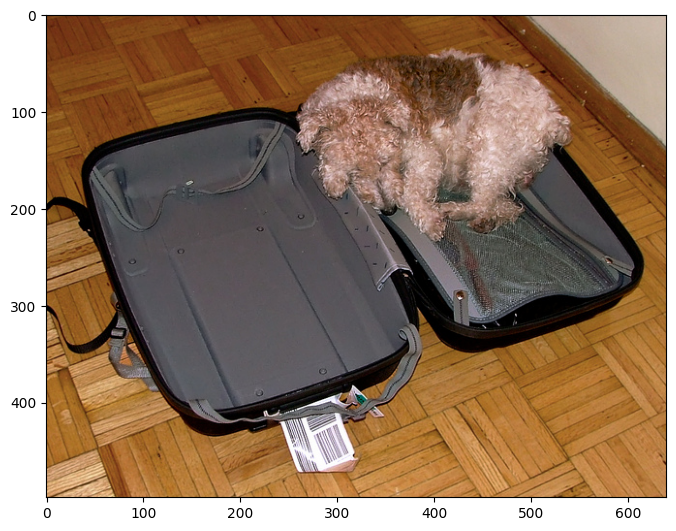

In [19]:
# Loading another image and its corresponding captions annotations
img = coco.loadImgs(next_pix[1])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)

# Getting annotation IDs for captions for the current image
annIds = coco_caps.getAnnIds(imgIds=img['id'])
anns = coco_caps.loadAnns(annIds)

# Displaying captions annotations
coco_caps.showAnns(anns)

# Showing the plot
plt.show()

A guard with a dog walking around a bus in a parking lot.
a man and a dog walking by a big bus
A boarder patrol agent and his dog inspect a passenger bus
A police K9 sniffs a large bus during a traffic stop.
A man walks a dog near a large bus.


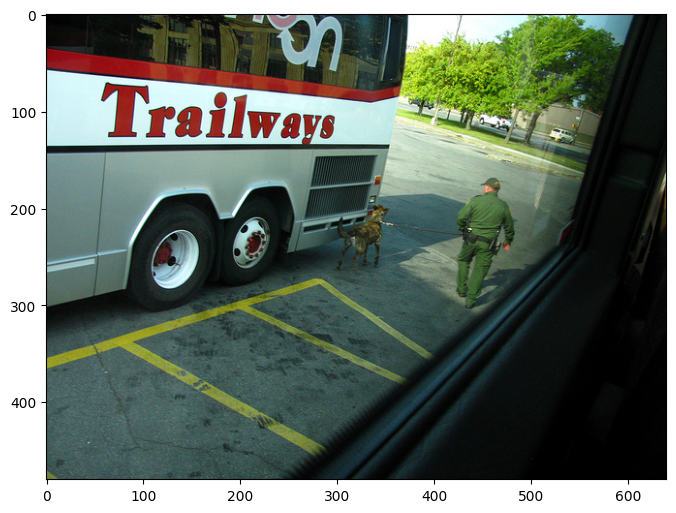

In [20]:
# Loading another image and its corresponding captions annotations
img = coco.loadImgs(next_pix[10])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)

# Getting annotation IDs for captions for the current image
annIds = coco_caps.getAnnIds(imgIds=img['id'])
anns = coco_caps.loadAnns(annIds)

# Displaying captions annotations
coco_caps.showAnns(anns)

# Showing the plot
plt.show()

there is a large plane at the airport 
a large airplane that is next to some  trucks
A large plane is parked on the runway at the airport

a couple of vehicles are near a large plane
A large jetliner sitting on top of an airport runway.


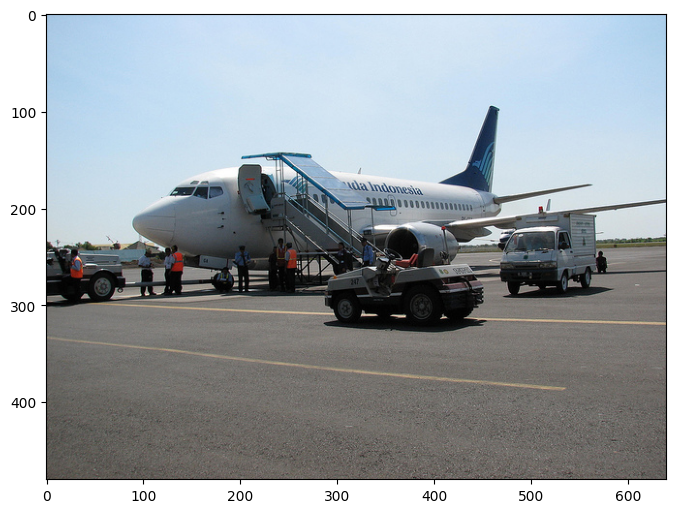

In [21]:
# Loading another image and its corresponding captions annotations
img = coco.loadImgs(next_pix[5])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)

# Getting annotation IDs for captions for the current image
annIds = coco_caps.getAnnIds(imgIds=img['id'])
anns = coco_caps.loadAnns(annIds)

# Displaying captions annotations
coco_caps.showAnns(anns)

# Showing the plot
plt.show()

Skinny horses are eating grass at the side of the road.
A herd of cattle traveling down a dirt road.
A gravel road with cows walking down it
Cows walk down an unpaved road next to a housing development.
A pathway through a town with steer and livestock.


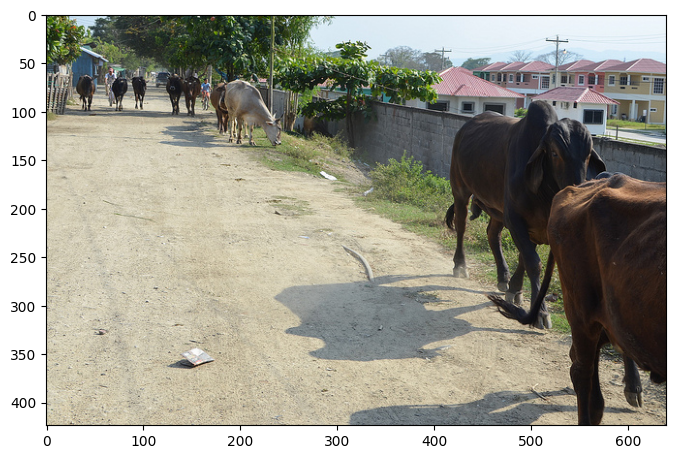

In [22]:
# Loading another image and its corresponding captions annotations
img = coco.loadImgs(next_pix[3])[0]
I = io.imread(img['coco_url'])
plt.imshow(I)

# Getting annotation IDs for captions for the current image
annIds = coco_caps.getAnnIds(imgIds=img['id'])
anns = coco_caps.loadAnns(annIds)

# Displaying captions annotations
coco_caps.showAnns(anns)

# Showing the plot
plt.show()

In [23]:
# Printing the total number of unique images for training
print("Total images for training:", len(imgIdss))

Total images for training: 12972


In [24]:
# Initializing an empty dictionary to store images and their captions
dataset = dict()

# Iterating over image IDs
for imgid in imgIdss:
    # Loading image information
    img = coco.loadImgs(imgid)[0]

    # Getting annotation IDs for captions for the current image
    annIds = coco_caps.getAnnIds(imgIds=img['id'])
    anns = coco_caps.loadAnns(annIds)

    # Initializing an empty list to store captions for the current image
    imgcaptions = []

    # Iterating over annotations for the current image
    for cap in anns:
        # Remove punctuation
        cap = cap['caption'].translate(str.maketrans('', '', string.punctuation))

        # Replace '-' with a blank space
        cap = cap.replace("-", " ")

        # Splitting the caption into words and converting each word to lowercase
        cap = cap.split()
        cap = [word.lower() for word in cap]

        cap = ' <start>' + " ".join(cap) + ' <end>'
        imgcaptions.append(cap)

    # Storing the image URL and its corresponding captions in the dataset dictionary
    dataset[img['coco_url']] = imgcaptions

# Printing the length of the dataset and an example of captions for an image
print("Length of Dataset:", len(dataset))
print("Example of captions for an image:", dataset['http://images.cocodataset.org/train2017/000000047084.jpg'])

Length of Dataset: 12972
Example of captions for an image: [' <start>a jumbo jet plane connected to a boarding deck <end>', ' <start>a large blue passenger plane sits on the tarmac at the airport <end>', ' <start>a blue commercial airplane parked at a jet way <end>', ' <start>a large airplane that is sitting out on the runway <end>', ' <start>a blue plane at the airport being offloaded <end>']


In [25]:
# Flattening the list of captions into a single list
flatten_list = list(chain.from_iterable(dataset.values()))

# Tokenizing the captions
tokenizer = Tokenizer(oov_token='<oov>')  # For words not found in word_index
tokenizer.fit_on_texts(flatten_list)  # Fit tokenizer on the flattened list of captions
total_words = len(tokenizer.word_index) + 1  # Total number of unique words in the vocabulary

# Printing information about the vocabulary and specific words
print("Vocabulary length:", total_words)
print("Bicycle ID:", tokenizer.word_index['bicycle'])
print("Airplane ID:", tokenizer.word_index['airplane'])
print("Dog ID:", tokenizer.word_index['bear'])

# Printing the word index dictionary
print(tokenizer.word_index)

Vocabulary length: 9475
Bicycle ID: 54
Airplane ID: 21
Dog ID: 29
{'<oov>': 1, 'a': 2, 'end': 3, 'start': 4, 'the': 5, 'on': 6, 'in': 7, 'of': 8, 'dog': 9, 'with': 10, 'and': 11, 'is': 12, 'to': 13, 'an': 14, 'sitting': 15, 'man': 16, 'street': 17, 'fire': 18, 'next': 19, 'hydrant': 20, 'airplane': 21, 'at': 22, 'white': 23, 'plane': 24, 'people': 25, 'two': 26, 'large': 27, 'standing': 28, 'bear': 29, 'black': 30, 'are': 31, 'flying': 32, 'small': 33, 'parked': 34, 'that': 35, 'down': 36, 'red': 37, 'woman': 38, 'near': 39, 'walking': 40, 'bike': 41, 'sky': 42, 'front': 43, 'by': 44, 'riding': 45, 'blue': 46, 'his': 47, 'brown': 48, 'water': 49, 'runway': 50, 'it': 51, 'airport': 52, 'some': 53, 'bicycle': 54, 'laying': 55, 'person': 56, 'air': 57, 'its': 58, 'jet': 59, 'up': 60, 'dogs': 61, 'frisbee': 62, 'top': 63, 'city': 64, 'field': 65, 'grass': 66, 'group': 67, 'through': 68, 'looking': 69, 'holding': 70, 'side': 71, 'yellow': 72, 'out': 73, 'road': 74, 'sidewalk': 75, 'while': 

In [26]:
# Creating an Xception model without the top (fully connected) layers, and using average pooling
model = Xception(include_top=False, pooling='avg')

# Initializing a dictionary to store image features
image_features = {}

# Iterating over each image in the dataset and extracting features
for img in tqdm(dataset.keys()):
    # Reading the image
    image = io.imread(img)

    # Converting grayscale images to RGB
    if image.ndim != 3:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # Resizing each image to 299x299
    image = cv2.resize(image, (299, 299))

    # Adding a batch dimension to the image
    image = np.expand_dims(image, axis=0)

    # Normalizing image pixels
    image = image / 127.5
    image = image - 1.0

    # Extracting features from the image using the pre-trained Xception model
    feature = model.predict(image)
    image_features[img] = feature

# Printing the length of the dictionary containing image features
print("Image features length:", len(image_features))


83683744/83683744 [==============================] - 1s 0us/step


  0%|          | 0/12972 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 391ms/step
Image features length: 12972


In [27]:
image_features['http://images.cocodataset.org/train2017/000000047084.jpg'].shape

(1, 2048)

In [28]:
def dict_to_list(descriptions):
    all_desc = []
    for key in descriptions.keys():
        [all_desc.append(d) for d in descriptions[key]]
    return all_desc

def max_length(descriptions):
    desc_list = dict_to_list(descriptions)
    return max(len(d.split()) for d in desc_list)

max_length = max_length(dataset)
max_length

50

In [29]:
# Create input-output sequence pairs from the image descriptions
def data_generator(descriptions, features, tokenizer, max_length):
    while 1:
        for key, description_list in descriptions.items():
            # Get the image feature for the current image
            feature = features[key][0]

            # Create input-output sequence pairs for the current image
            input_image, input_sequence, output_word = create_sequences(tokenizer, max_length, description_list, feature)

            # Yield the input-output pairs
            yield ([input_image, input_sequence], output_word)

# Create input-output sequence pairs for a single image
def create_sequences(tokenizer, max_length, desc_list, feature):
    X1, X2, y = list(), list(), list()

    # Walk through each description for the image
    for desc in desc_list:
        # Encode the sequence
        seq = tokenizer.texts_to_sequences([desc])[0]

        # Split one sequence into multiple X,y pairs
        for i in range(1, len(seq)):
            # Split into input and output pair
            in_seq, out_seq = seq[:i], seq[i]

            # Pad input sequence
            in_seq = pad_sequences([in_seq], maxlen=max_length)[0]

            # Encode output sequence
            out_seq = to_categorical([out_seq], num_classes=total_words)[0]

            # Store the input image feature, input caption sequence, and output word
            X1.append(feature)  # Image features
            X2.append(in_seq)   # Caption input
            y.append(out_seq)   # Caption output

    return np.array(X1), np.array(X2), np.array(y)

In [30]:
# Define the captioning model
def define_model(total_words, max_length):
    # Features from the CNN model squeezed from 2048 to 256 nodes
    inputs1 = Input(shape=(2048,))
    fe1 = Dropout(0.5)(inputs1)
    fe2 = Dense(256, activation='relu')(fe1)

    # LSTM sequence model
    inputs2 = Input(shape=(max_length,))
    se1 = Embedding(total_words, 256, mask_zero=True)(inputs2)
    se2 = Dropout(0.5)(se1)
    se3 = LSTM(256)(se2)

    # Merging both models
    decoder1 = add([fe2, se3])
    decoder2 = Dense(256, activation='relu')(decoder1)
    outputs = Dense(total_words, activation='softmax')(decoder2)

    # Tie it together [image, seq] [word]
    model = Model(inputs=[inputs1, inputs2], outputs=outputs)
    model.compile(loss='categorical_crossentropy', optimizer='adam')

    # Summarize model
    print(model.summary())
    plot_model(model, to_file='model.png', show_shapes=True)  # Plotting the model architecture

    return model

In [31]:
# Printing dataset information
print('Dataset:', len(dataset))
print('Descriptions: train=', len(dataset))
print('Photos: train=', len(image_features))
print('Vocabulary Size:', total_words)
print('Description Length:', max_length)

# Defining and compiling the model
model = define_model(total_words, max_length)

# Setting up training parameters
epochs = 1
steps = len(dataset)

# Creating a directory to save trained models
import os
os.makedirs("models", exist_ok=True)

# Training the model
for i in range(epochs):
  generator = data_generator(dataset, image_features, tokenizer, max_length)
  model.fit(generator, epochs=epochs, steps_per_epoch=steps, verbose=1)
  model.save("models/model_" + str(i) + ".h5")  # Saving the trained model

Dataset: 12972
Descriptions: train= 12972
Photos: train= 12972
Vocabulary Size: 9475
Description Length: 50
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 50)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 50, 256)              2425600   ['input_3[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 2s 2s/step



start a large passenger jet flying over a cloudy sky end


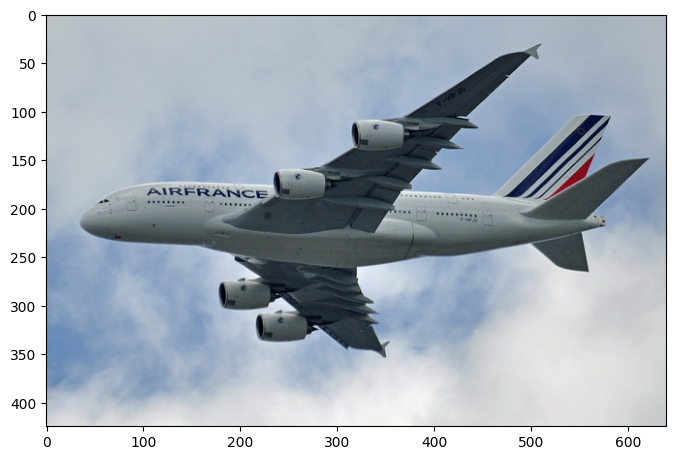

In [32]:
# List of image paths for which captions will be generated
img_paths = ["../content/train2017/000000000081.jpg",
             "../content/val2017/000000022396.jpg",
             "../content/val2017/000000098520.jpg",
             "../content/val2017/000000101762.jpg",
             "../content/val2017/000000224051.jpg"]

# Function to extract features from an image using a pre-trained model
def extract_features(filename, model):
    try:
        image = Image.open(filename)
    except:
        print("ERROR: Couldn't open image! Make sure the image path and extension are correct")
    image = image.resize((299, 299))
    image = np.array(image)

    # For images that have 4 channels, we convert them into 3 channels
    if image.shape[2] == 4:
        image = image[..., :3]
    image = np.expand_dims(image, axis=0)
    image = image / 127.5
    image = image - 1.0
    feature = model.predict(image)
    return feature

# Function to map an integer to its corresponding word in the tokenizer's word_index
def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

# Function to generate a caption for an image using the trained model and tokenizer
def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo, sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)

        if word is None:
            break
        in_text += ' ' + word

        if word == 'end':
            break
    return in_text

# Loading the trained model and Xception model for feature extraction
model = load_model('./models/model_0.h5')  # Change the path to your model file
xception_model = Xception(include_top=False, pooling="avg")

# Extracting features and generating captions for the first image in the list
photo = extract_features(img_paths[0], xception_model)
img = Image.open(img_paths[0])
description = generate_desc(model, tokenizer, photo, max_length)  # Make sure you have defined tokenizer and max_length
print("\n\n")
print(description)
plt.imshow(img)
plt.show()  # Don't forget to show the plot

1/1 [==============================] - 0s 422ms/step



start a plane flying over a blue sky end


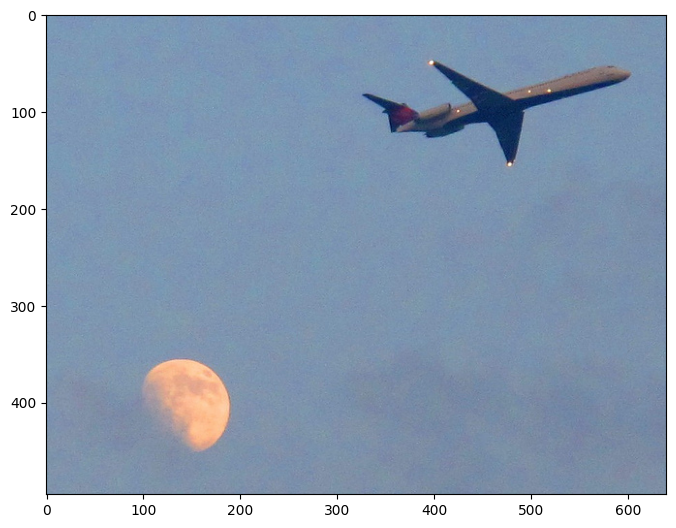

In [33]:
# Extracting features and generating captions for the second image in the list
photo = extract_features(img_paths[1], xception_model)
img = Image.open(img_paths[1])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 0s 391ms/step



start a large passenger jet sitting on top of an airport tarmac end


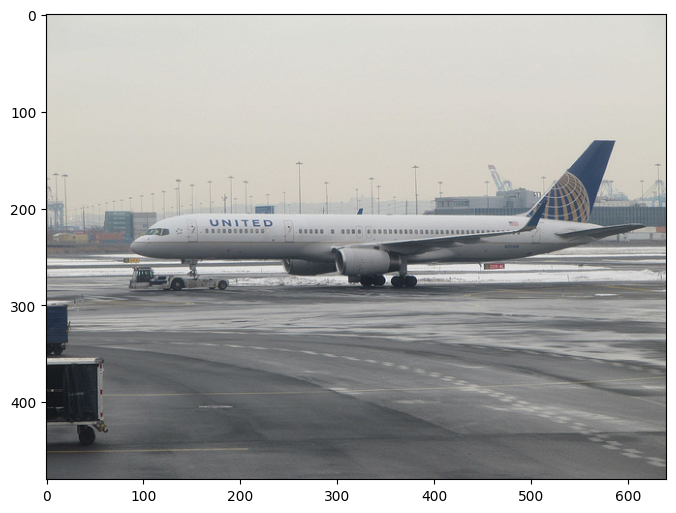

In [34]:
# Extracting features and generating captions for the third image in the list
photo = extract_features(img_paths[2], xception_model)
img = Image.open(img_paths[2])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 1s 573ms/step



start a man is riding a bike on a bike end


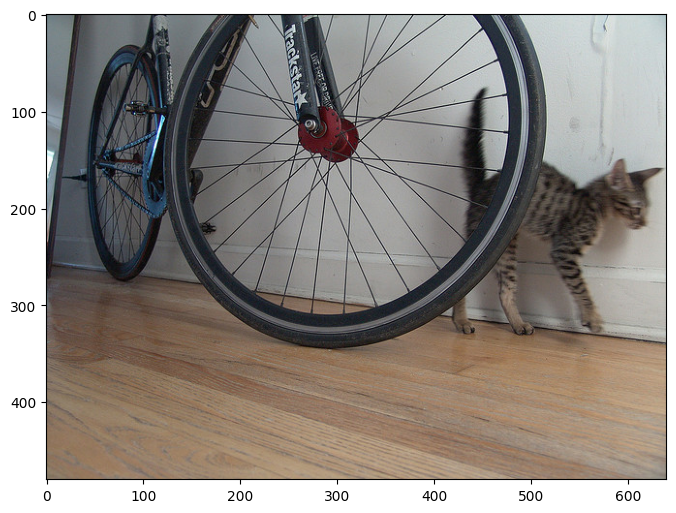

In [35]:
# Extracting features and generating captions for the fourth image in the list
photo = extract_features(img_paths[3], xception_model)
img = Image.open(img_paths[3])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

1/1 [==============================] - 1s 688ms/step



start a man is riding a bike down a street end


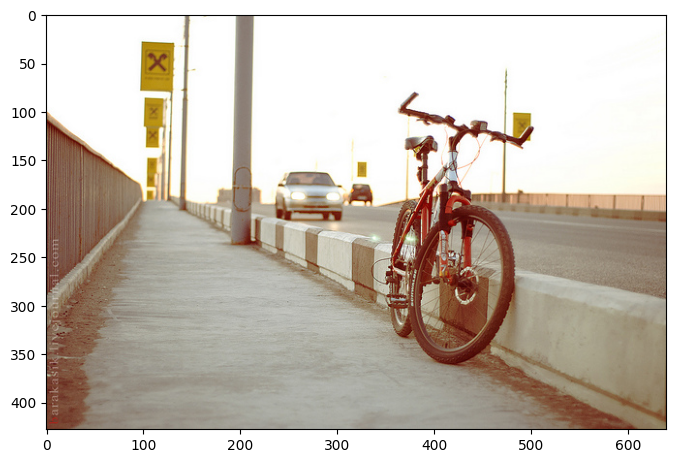

In [36]:
# Extracting features and generating captions for the fifth image in the list
photo = extract_features(img_paths[4], xception_model)
img = Image.open(img_paths[4])
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)

In [37]:
# Downloading required NLTK resources
nltk.download('punkt')

# Example ground truth captions and generated captions
reference_captions = [['a', 'brown', 'dog', 'is', 'running', 'in', 'the', 'grass'],
                      ['a', 'black', 'cat', 'is', 'sitting', 'on', 'the', 'windowsill']]

generated_caption = ['a', 'brown', 'dog', 'is', 'running', 'on', 'the', 'field']

# Calculate BLEU score
bleu_score = sentence_bleu(reference_captions, generated_caption)
print(f"BLEU Score: {bleu_score}")

# Assuming you have reference and candidate captions
reference_caption = ["a brown dog is playing in the grass"]
candidate_caption = "a dog is playing with a ball in the field"

# Tokenize both reference and candidate captions for METEOR score
tokenized_reference_caption = [word_tokenize(sent) for sent in reference_caption]
tokenized_candidate_caption = word_tokenize(candidate_caption)

# Calculate METEOR score
meteor_score_value = meteor_score(tokenized_reference_caption, tokenized_candidate_caption)
print("METEOR Score:", meteor_score_value)

# Calculate ROUGE score
rouge = Rouge()
rouge_scores = rouge.get_scores(candidate_caption, reference_caption[0])  # Pass only the first reference caption as a string
print("ROUGE Scores:", rouge_scores)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


BLEU Score: 0.5946035575013605
METEOR Score: 0.6859756097560975
ROUGE Scores: [{'rouge-1': {'r': 0.75, 'p': 0.6666666666666666, 'f': 0.7058823479584776}, 'rouge-2': {'r': 0.42857142857142855, 'p': 0.3333333333333333, 'f': 0.37499999507812504}, 'rouge-l': {'r': 0.75, 'p': 0.6666666666666666, 'f': 0.7058823479584776}}]


In [38]:
# Define a function to generate speech for a given caption
def generate_speech(caption):
    # Convert each word in the caption to lowercase
    caption_lower = [word.lower() for word in caption.split()]

    # Join the words with spaces to form the complete caption
    caption_str = ' '.join(caption_lower)

    # Speak out the entire caption using gTTS
    tts = gTTS(text=caption_str, lang='en', slow=False)
    tts.save("generated_caption.mp3")

    # Display the audio
    display(ipd.Audio("generated_caption.mp3"))

# Iterate over each image path
for img_path in img_paths:
    # Extract features for the current image
    photo = extract_features(img_path, xception_model)
    img = Image.open(img_path)

    # Generate caption for the current image
    description = generate_desc(model, tokenizer, photo, max_length)

    # Print the generated caption
    print("\n\n")
    print(description)
    plt.imshow(img)
    plt.show()

    # Generate speech for the caption
    generate_speech(description)


Output hidden; open in https://colab.research.google.com to view.

Please upload the input image:


Saving 000000000081.jpg to 000000000081 (10).jpg
1/1 [==============================] - 1s 640ms/step


Generated Caption:
startseq


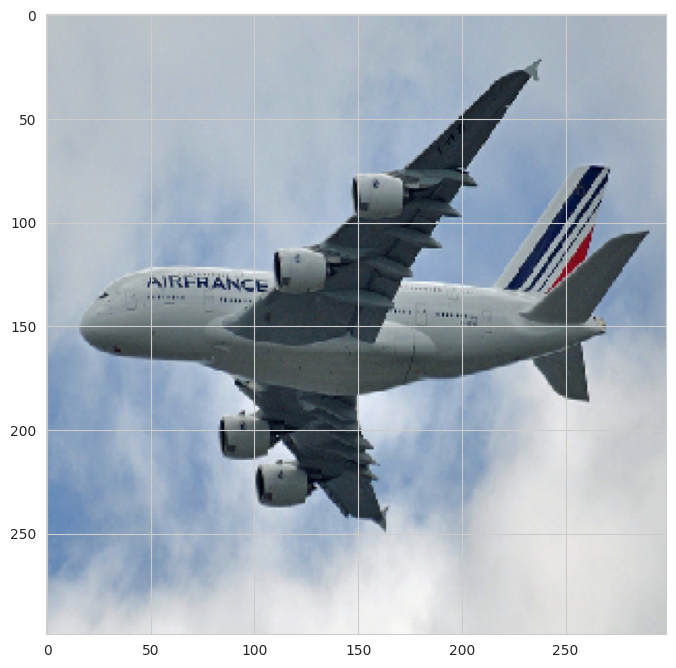

In [61]:
# Define ground truth captions for the uploaded image
ground_truth_captions = [
    "A beautiful sunset over the ocean.",
    "A colorful sunset reflecting on the water.",
    "The sun setting behind the clouds."
]

# Load the pre-trained image captioning model
model = load_model('./models/model_0.h5')

# Load the tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(ground_truth_captions)

# Define maximum sequence length for captions (should match the maximum length used during training)
max_length = 50

# Validate the uploaded image
def validate_image(filename):
    valid_extensions = ['.jpg', '.jpeg', '.png']
    if filename.lower().endswith(tuple(valid_extensions)):
        return True
    else:
        print("Invalid file format. Please upload a valid image file.")
        return False

# Get the path of the input image from the user
def get_image_path():
    # Upload an image file
    print("Please upload the input image:")

    uploaded = files.upload()
    for filename in uploaded.keys():
        if validate_image(filename):
            return filename
        else:
            return None

# Get the path of the input image from the user
input_image_path = get_image_path()

# Check if the file exists at the specified path
if input_image_path:
    try:
        # Load the uploaded image
        img = image.load_img(input_image_path, target_size=(299, 299))

        # Convert the image to a numpy array
        photo = image.img_to_array(img)
        photo = np.expand_dims(photo, axis=0)
        photo = photo / 255.0  # Normalize the image

        # Extract features for the input image
        features = xception_model.predict(photo)

        # Generate caption for the input image
        def generate_desc(model, tokenizer, photo, max_length):
            in_text = 'startseq'
            for i in range(max_length):
                sequence = tokenizer.texts_to_sequences([in_text])[0]
                sequence = pad_sequences([sequence], maxlen=max_length)
                yhat = model.predict([photo,sequence], verbose=0)
                yhat = np.argmax(yhat)
                word = word_for_id(yhat, tokenizer)
                if word is None:
                    break
                in_text += ' ' + word
                if word == 'endseq':
                    break
            return in_text

        description = generate_desc(model, tokenizer, features, max_length)

        # Print the generated caption
        print("\n\nGenerated Caption:")
        print(description)

        # Display the uploaded image
        plt.imshow(img)
        plt.show()  # Don't forget to show the plot
    except Exception as e:
        print("An error occurred while processing the image:", e)
else:
    print("No image uploaded.")


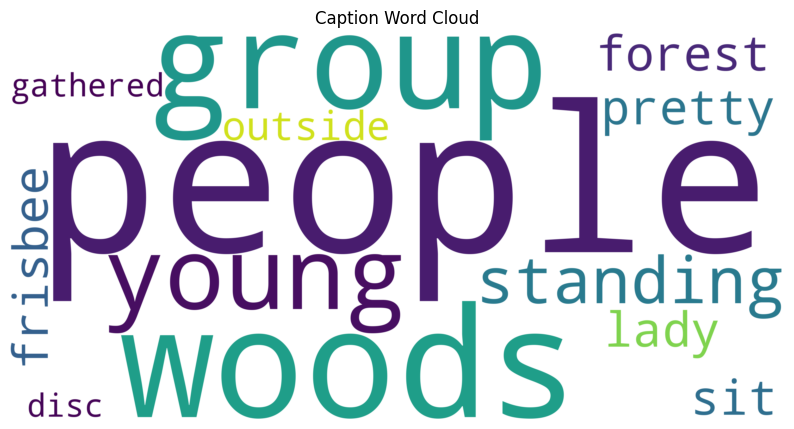

In [40]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all captions into a single string
all_captions = ' '.join([ann['caption'] for ann in anns])

# Generate word cloud with adjusted parameters
wordcloud = WordCloud(width=4000, height=2000, background_color='white', max_words=15000,
                      stopwords=None, contour_color='steelblue').generate(all_captions)

# Plotting the word cloud
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Caption Word Cloud')
plt.show()



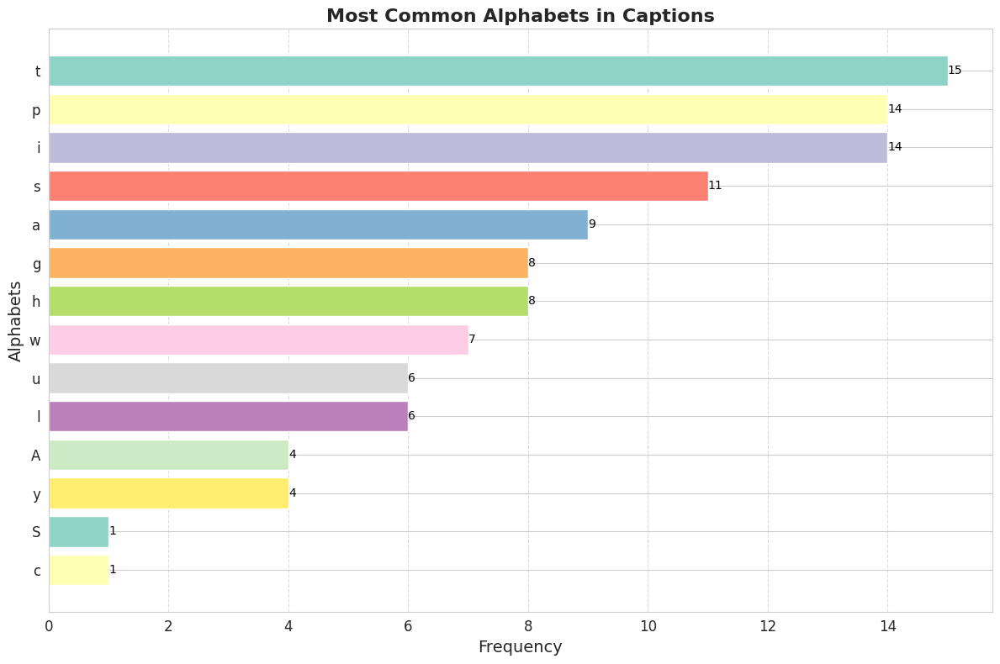

In [62]:
import spacy
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Load English language model
nlp = spacy.load("en_core_web_sm")

# Function to extract noun phrases from captions
def extract_noun_phrases(text):
    doc = nlp(text)
    return [chunk.text for chunk in doc.noun_chunks]

# Extract noun phrases from all captions
all_noun_phrases = [phrase for caption in all_captions for phrase in extract_noun_phrases(caption)]

# Count the frequency of each noun phrase
noun_phrase_freq = Counter(all_noun_phrases)

# Plotting
plt.figure(figsize=(12, 8))  # Increase figure size for better visualization

# Using seaborn's color palette for better color selection
colors = sns.color_palette("Set3", len(noun_phrase_freq))

most_common_noun_phrases = noun_phrase_freq.most_common(20)
bars = plt.barh([phrase[0] for phrase in most_common_noun_phrases], [count for _, count in most_common_noun_phrases], color=colors)

# Adding data labels on each bar
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.0f}',
             va='center', ha='left', fontsize=10, color='black')

plt.xlabel('Frequency', fontsize=14)  # Increase font size for axis labels
plt.ylabel('Alphabets', fontsize=14)  # Increase font size for axis labels
plt.title('Most Common Alphabets in Captions', fontsize=16, fontweight='bold')  # Increase font size and set to bold
plt.gca().invert_yaxis()  # Invert y-axis to display the most common phrases at the top
plt.xticks(fontsize=12)  # Increase font size for x-axis ticks
plt.yticks(fontsize=12)  # Increase font size for y-axis ticks
plt.grid(axis='x', linestyle='--', alpha=0.7)  # Add grid lines for better readability
plt.tight_layout()  # Adjust layout to prevent overlapping labels
plt.show()


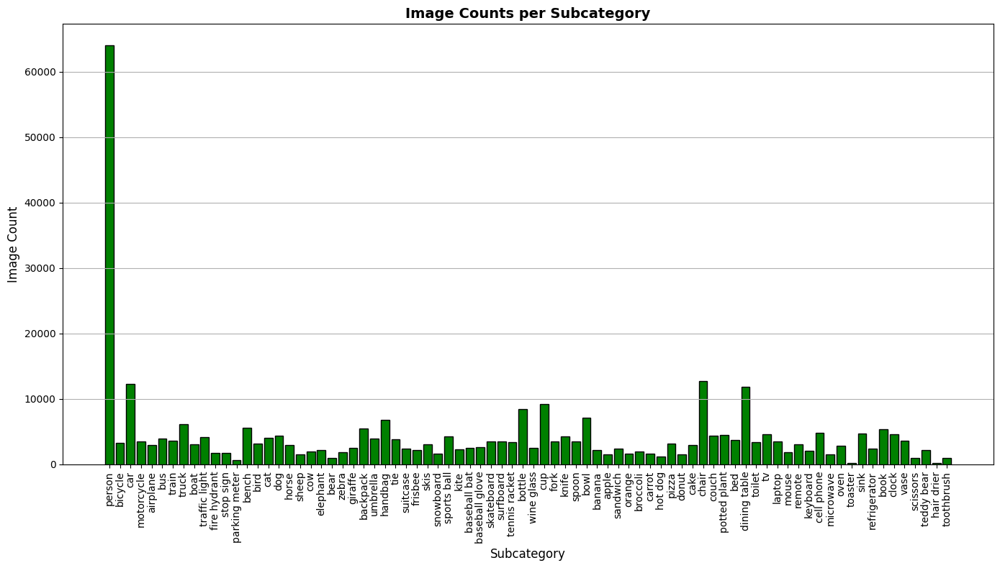

In [41]:
import matplotlib.pyplot as plt

# Subcategories and their corresponding image counts
subcategories_counts = length_dict

# Extract subcategories and their counts
subcategories = list(subcategories_counts.keys())
counts = list(subcategories_counts.values())

# Plotting the histogram
plt.figure(figsize=(14, 8))  # Increase figure size
plt.bar(range(len(subcategories)), counts, color='green', edgecolor='black')  # Change color to navy
plt.xlabel('Subcategory', fontsize=12)  # Reduce font size
plt.ylabel('Image Count', fontsize=12)  # Reduce font size
plt.title('Image Counts per Subcategory', fontsize=14, fontweight='bold')  # Bold title
plt.xticks(range(len(subcategories)), subcategories, rotation=90, ha='center', fontsize=10)  # Adjust rotation, alignment, and font size
plt.gca().yaxis.grid(True)  # Add grid lines for y-axis
plt.tight_layout()
plt.show()


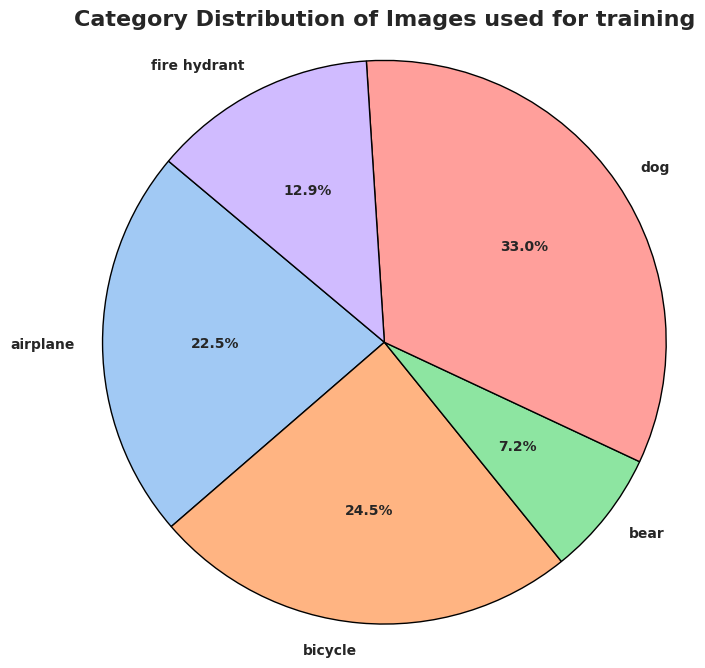

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Category names and their corresponding image counts
categories_counts = {
    'airplane': length_dict.get('airplane', 0),
    'bicycle': length_dict.get('bicycle', 0),
    'bear': length_dict.get('bear', 0),
    'dog': length_dict.get('dog', 0),
    'fire hydrant': length_dict.get('fire hydrant', 0)
}

# Extract category names and their counts
categories = list(categories_counts.keys())
counts = list(categories_counts.values())

# Set the style
sns.set_style("whitegrid")

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=categories, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("pastel"), wedgeprops={'edgecolor': 'black'})
plt.title('Category Distribution of Images used for training', fontsize=16, fontweight='bold')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Make text bold
for text in plt.gca().texts:
    text.set_fontweight('bold')

plt.show()
